# **Lab5.1 : CNN Feature maps**

In [39]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
import torch
from torch import nn
import torchvision
import torchvision.models as models
import torchvision.transforms as transforms

## Get VGG16 Pretrained model
Explore the VGG16 achitecture.
<details>
<summary>
<font size="3" color="orange">
<b>Expected output</b>
</font>
</summary>

```
VGG(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (6): ReLU(inplace=True)
    (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (8): ReLU(inplace=True)
    (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
    (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (13): ReLU(inplace=True)
    (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (15): ReLU(inplace=True)
    (16): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (17): Conv2d(256, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (18): ReLU(inplace=True)
    (19): Conv2d(512, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (20): ReLU(inplace=True)
    (21): Conv2d(512, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (22): ReLU(inplace=True)
    (23): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (24): Conv2d(512, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (25): ReLU(inplace=True)
    (26): Conv2d(512, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (27): ReLU(inplace=True)
    (28): Conv2d(512, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (29): ReLU(inplace=True)
    (30): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (avgpool): AdaptiveAvgPool2d(output_size=(7, 7))
  (classifier): Sequential(
    (0): Linear(in_features=25088, out_features=4096, bias=True)
    (1): ReLU(inplace=True)
    (2): Dropout(p=0.5, inplace=False)
    (3): Linear(in_features=4096, out_features=4096, bias=True)
    (4): ReLU(inplace=True)
    (5): Dropout(p=0.5, inplace=False)
    (6): Linear(in_features=4096, out_features=1000, bias=True)
  )
)
```

</details>


In [40]:
### START CODE HERE ###
# vgg16 = models.vgg16(pretrained=True)
vgg16 = models.vgg16(weights='DEFAULT')
vgg16.eval()  # Set the model to evaluation mode
print(vgg16)
### END CODE HERE ###

VGG(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (6): ReLU(inplace=True)
    (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (8): ReLU(inplace=True)
    (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
    (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (13): ReLU(inplace=True)
    (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (15): ReLU(inplace=True)
    (16): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1

Explore all layers in feature extractor part.
[Read more.](https://pytorch.org/docs/stable/generated/torch.nn.Module.html#torch.nn.Module.named_modules:~:text=named_modules(memo%3DNone%2C%20prefix%3D%27%27%2C%20remove_duplicate%3DTrue))


<details>
<summary>
<font size="3" color="orange">
<b>Expected output</b>
</font>
</summary>

```
-------------------
0:Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
-------------------
1:ReLU(inplace=True)
-------------------
2:Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
-------------------
3:ReLU(inplace=True)
-------------------
4:MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
...
28:Conv2d(512, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
-------------------
29:ReLU(inplace=True)
-------------------
30:MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
```

</details>


In [41]:
### START CODE HERE ###

# Extract the feature extractor part
features = vgg16.features

# Print the layers in the feature extractor part
print("Layers in the feature extractor part of VGG16:")
for i, layer in enumerate(features.children()):
    print("-"*100)
    print(f"Layer {i}: {layer}")

# print("\nSequential structure of the feature extractor part:")
# print(features)

### END CODE HERE ###    

Layers in the feature extractor part of VGG16:
----------------------------------------------------------------------------------------------------
Layer 0: Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
----------------------------------------------------------------------------------------------------
Layer 1: ReLU(inplace=True)
----------------------------------------------------------------------------------------------------
Layer 2: Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
----------------------------------------------------------------------------------------------------
Layer 3: ReLU(inplace=True)
----------------------------------------------------------------------------------------------------
Layer 4: MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
----------------------------------------------------------------------------------------------------
Layer 5: Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1)

Examine weight and bias of first Convolution layer and ReLU layer. [Read more.](https://pytorch.org/tutorials/beginner/introyt/modelsyt_tutorial.html)
<details>
<summary>
<font size="3" color="orange">
<b>Expected output</b>
</font>
</summary>

```
torch.Size([64, 3, 3, 3])
Kernel : 0
*************************************
Channel : 0
[[-0.5537306   0.1427047   0.5289615 ]
 [-0.58312404  0.35655147  0.76566225]
 [-0.69022113 -0.04801885  0.48409155]]
Min coefficients -0.69022113
-------------------------------------
Channel : 1
[[ 0.17548391  0.00986297 -0.08141315]
 [ 0.04408892 -0.07032251 -0.26035076]
 [ 0.13239175 -0.1727862  -0.1322633 ]]
Min coefficients -0.26035076
-------------------------------------
Channel : 2
[[ 0.31302562 -0.1659134  -0.42752257]
 [ 0.47518674 -0.08267727 -0.48699915]
 [ 0.63202524  0.01930757 -0.2775303 ]]
Min coefficients -0.48699915
-------------------------------------


Kernel : 1
*************************************
Channel : 0
[[ 0.23253721  0.12665984  0.1860546 ]
 [-0.42805314 -0.24348575  0.24628444]
 [-0.2506616   0.14177004 -0.0054864 ]]
Min coefficients -0.42805314
-------------------------------------
Channel : 1
[[-0.14076217 -0.21902554  0.15040672]
 [-0.84126675 -0.3517562   0.5639763 ]
 [-0.24194452  0.5192758   0.5391499 ]]
Min coefficients -0.84126675
-------------------------------------
Channel : 2
[[-0.31432396 -0.37047786 -0.13093661]
 [-0.47144184 -0.15503426  0.3458899 ]
 [ 0.05438393  0.5868277   0.49579924]]
Min coefficients -0.47144184
-------------------------------------

...
```

</details>

In [42]:
### START CODE HERE ###
# Access the first Convolutional layer and ReLU layer
first_conv = features[0]  # Conv2d layer
first_relu = features[1]  # ReLU layer

# Print details for the first Convolutional layer
print("First Convolutional Layer (Conv2d):")
print("Weights shape:", first_conv.weight.shape)
# Iterate through each kernel
for kernel_index in range(first_conv.weight.shape[0]):  # first_conv.weight.shape[0] is the number of kernels (output channels)
    print(f"\nKernel : {kernel_index}")
    print("*************************************")
    
    # Iterate over the input channels of the current kernel
    for channel_index in range(first_conv.weight.shape[1]):  # first_conv.weight.shape[1] is the number of input channels
        print(f"Channel : {channel_index}")
        kernel_weights = first_conv.weight[kernel_index, channel_index].detach().numpy()  # Get the weights of the ith channel of the current kernel
        print(kernel_weights)
        print("Min coefficient:", kernel_weights.min())
        print("-------------------------------------")

# Print details for the ReLU layer
print("\nFirst ReLU Layer:")
# print("Weights shape:", first_relu.weight.shape)
print("Type:", type(first_relu))
print("ReLU Layer (No weights or biases to display)")
print("*************************************")
### END CODE HERE ###

First Convolutional Layer (Conv2d):
Weights shape: torch.Size([64, 3, 3, 3])

Kernel : 0
*************************************
Channel : 0
[[-0.5537306   0.1427047   0.5289615 ]
 [-0.58312404  0.35655147  0.76566225]
 [-0.69022113 -0.04801885  0.48409155]]
Min coefficient: -0.69022113
-------------------------------------
Channel : 1
[[ 0.17548391  0.00986297 -0.08141315]
 [ 0.04408892 -0.07032251 -0.26035076]
 [ 0.13239175 -0.1727862  -0.1322633 ]]
Min coefficient: -0.26035076
-------------------------------------
Channel : 2
[[ 0.31302562 -0.1659134  -0.42752257]
 [ 0.47518674 -0.08267727 -0.48699915]
 [ 0.63202524  0.01930757 -0.2775303 ]]
Min coefficient: -0.48699915
-------------------------------------

Kernel : 1
*************************************
Channel : 0
[[ 0.23253721  0.12665984  0.1860546 ]
 [-0.42805314 -0.24348575  0.24628444]
 [-0.2506616   0.14177004 -0.0054864 ]]
Min coefficient: -0.42805314
-------------------------------------
Channel : 1
[[-0.14076217 -0.219025

In [43]:
assert isinstance(first_conv, nn.Conv2d), "First layer should be a convolutional layer"
assert isinstance(first_relu, nn.ReLU), "Second layer should be a ReLU activation"
assert first_conv.weight.shape == (64, 3, 3, 3), "First layer weight shape should be (64, 3, 3, 3)"

Examine Biases
<details>
<summary>
<font size="3" color="orange">
<b>Expected output</b>
</font>
</summary>

```
Bias : Parameter containing:
tensor([ 0.4034,  0.3778,  0.4644, -0.3228,  0.3940, -0.3953,  0.3951, -0.5496,
         ...
         0.2300,  0.4979,  0.5553,  0.5230, -0.2182,  0.0117, -0.5516,  0.2108],
       requires_grad=True)
```

</details>

In [44]:
### START CODE HERE ###
print("Bias :", first_conv.bias)
#print("Bias :", first_relu.bias) #'ReLU' object has no attribute 'bias'
### END CODE HERE ###

Bias : Parameter containing:
tensor([ 0.4034,  0.3778,  0.4644, -0.3228,  0.3940, -0.3953,  0.3951, -0.5496,
         0.2693, -0.7602, -0.3508,  0.2334, -1.3239, -0.1694,  0.3938, -0.1026,
         0.0460, -0.6995,  0.1549,  0.5628,  0.3011,  0.3425,  0.1073,  0.4651,
         0.1295,  0.0788, -0.0492, -0.5638,  0.1465, -0.3890, -0.0715,  0.0649,
         0.2768,  0.3279,  0.5682, -1.2640, -0.8368, -0.9485,  0.1358,  0.2727,
         0.1841, -0.5325,  0.3507, -0.0827, -1.0248, -0.6912, -0.7711,  0.2612,
         0.4033, -0.4802, -0.3066,  0.5807, -1.3325,  0.4844, -0.8160,  0.2386,
         0.2300,  0.4979,  0.5553,  0.5230, -0.2182,  0.0117, -0.5516,  0.2108],
       requires_grad=True)


## Process the feature maps
<details>
<summary>
<font size="3" color="orange">
<b>Expected output</b>
</font>
</summary>

- The output should resemble this, but not be identical

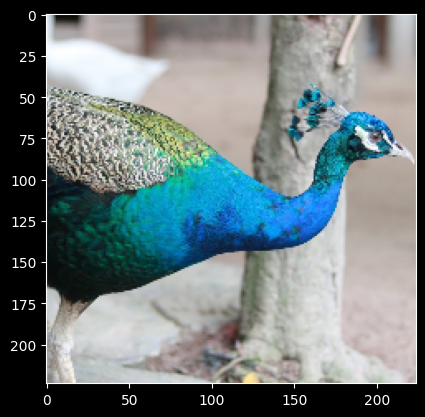

</details>

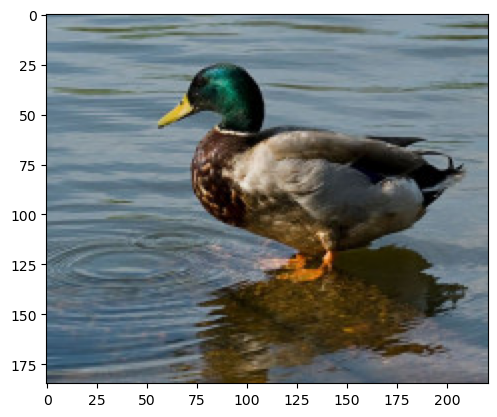

In [45]:
### START CODE HERE ###
img = cv2.imread('images/duck2.jpg')
img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
plt.imshow(img)
plt.show()
### END CODE HERE ###

Normalize the image using the mean and standard deviation values from the [VGG16 normalization parameters.](https://pytorch.org/vision/main/models/generated/torchvision.models.vgg16.html)
<details>
<summary>
<font size="3" color="orange">
<b>Expected output</b>
</font>
</summary>

- The output should resemble this, but not be identical

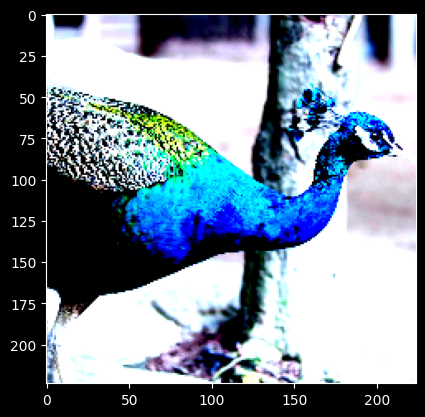

</details>

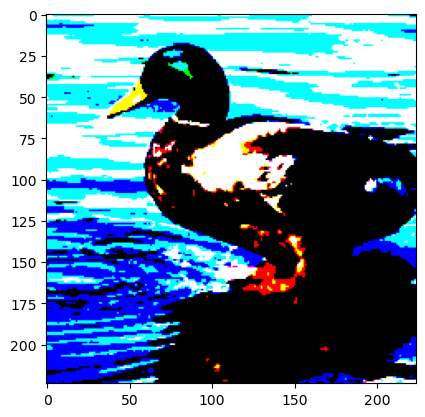

In [46]:
# Define the mean and std for VGG16 normalization
mean=[0.48235, 0.45882, 0.40784]
std=[0.00392156862745098, 0.00392156862745098, 0.00392156862745098]

# Define the transformation steps
transform = transforms.Compose([
    transforms.ToPILImage(), # Convert to PIL image for resizing and cropping
    transforms.Resize(256, interpolation=transforms.InterpolationMode.BILINEAR),
    transforms.CenterCrop(224),
    transforms.ToTensor(),  # Converts to Tensor and scales to [0.0, 1.0] ; Convert image to tensor : Tensor เป็นโครงสร้างข้อมูลที่ใช้ในการเก็บข้อมูลเชิงตัวเลขหลายมิติ ซึ่งเหมาะสำหรับการแทนข้อมูลภาพ
    transforms.Normalize(mean=mean, std=std)
])

image_tensor = transform(img)

# Convert tensor to numpy array
image_numpy = image_tensor.permute(1, 2, 0).numpy()  # Change from (C, H, W) to (H, W, C) ; permute เป็นเมธอดที่ถูกออกแบบมาโดยเฉพาะสำหรับการสลับมิติของ tensor ใน PyTorch
# [0,224] => Clip values to be in the range [0, 1]
image_numpy = np.clip(image_numpy, 0, 1)

# Display the image
plt.imshow(image_numpy)
plt.show()

Convert the [NumPy image to a PyTorch tensor](https://pytorch.org/docs/stable/torch.html#:~:text=memory%2Dmapped%20file.-,from_numpy,-Creates%20a%20Tensor), ensuring it has the [correct dimensions and data type](https://pytorch.org/vision/main/models/generated/torchvision.models.vgg16.html) for input to the first convolution layer.

In [47]:
### START CODE HERE ###

# print("image_tensor :",image_tensor.shape)

# Add batch dimension
# image_tensor = image_tensor.unsqueeze(0)  # Shape: [1, 3, height, width] -> มิติที่ 0 แทนจำนวนภาพใน batch (ในกรณีนี้มี 1 ภาพ)

# Ensure tensor data type is float32
image_tensor = image_tensor.to(torch.float32)

# Print tensor shape and type for verification
print(f"Tensor shape: {image_tensor.shape}")
print(f"Tensor dtype: {image_tensor.dtype}")

### END CODE HERE ###

Tensor shape: torch.Size([3, 224, 224])
Tensor dtype: torch.float32


Complete the function below. <br>
The plot_featuremap function takes a set of feature maps and creates a grid of subplots, each displaying a single feature map. 

In [48]:
# ### START CODE HERE ###
# def plot_featuremap(img, title):
#     """
#     Plot the feature maps from a tensor. Each feature map will be displayed in a subplot.
    
#     Args:
#         img (torch.Tensor): The tensor containing feature maps with shape [batch_size, num_channels, height, width].
#         title (str): The title of the plot.
#     """
#     Ensure img has the shape [batch_size, num_channels, height, width]
#     if img.dim() == 3:
#         img = img.unsqueeze(0)  # Add batch dimension

#     # Check if the image tensor has the correct shape
#     if img.dim() != 4 or img.size(0) != 1:
#         raise ValueError("Input tensor must be of shape [1, num_channels, height, width]")
    
#     # Get the number of feature maps
#     num_channels = img.size(1)
    
#     # Define the grid size
#     grid_size = int(np.ceil(np.sqrt(num_channels)))
    
#     # Create a new figure
#     fig, axes = plt.subplots(grid_size, grid_size, figsize=(grid_size * 2, grid_size * 2))
    
#     # Flatten the axes array for easy iteration
#     axes = axes.flatten()
    
#     # Plot each feature map
#     for i in range(num_channels):
#         feature_map = img[0, i].detach().cpu().numpy()
        
#         # Check feature map dimensions
#         if feature_map.ndim != 2:
#             raise ValueError(f"Feature map {i} has invalid shape {feature_map.shape}")
        
#         axes[i].imshow(feature_map, cmap='gray')
#         axes[i].set_title(f'{i}') 
#         axes[i].axis('off')  # Hide axes

#     # Hide any unused subplots
#     for j in range(num_channels, len(axes)):
#         axes[j].axis('off')
    
#     # Set the title for the entire plot
#     plt.suptitle(title)
#     plt.tight_layout()
#     plt.show()
# ### END CODE HERE ###

In [49]:
### START CODE HERE ###
def plot_featuremap(img, title):
    """
    Plot the feature maps from a tensor. Each feature map will be displayed in a subplot.
    
    Args:
        img (torch.Tensor): The tensor containing feature maps with shape [batch_size, num_channels, height, width].
        title (str): The title of the plot.
    """
    # Get the number of feature maps
    num_channels = img.size(0)
    
    # Define the grid size
    grid_size = int(np.ceil(np.sqrt(num_channels)))
    
    # Create a new figure
    fig, axes = plt.subplots(grid_size, grid_size, figsize=(grid_size * 2, grid_size * 2))
    
    # Flatten the axes array for easy iteration
    axes = axes.flatten()
    
    # Plot each feature map
    for i in range(num_channels):
        feature_map = img[i].detach().cpu().numpy()
        
        axes[i].imshow(feature_map, cmap='gray')
        axes[i].set_title(f'{i}') 
        axes[i].axis('off')  # Hide axes

    # Hide any unused subplots
    for j in range(num_channels, len(axes)):
        axes[j].axis('off')
    
    # Set the title for the entire plot
    plt.suptitle(title)
    plt.tight_layout()
    plt.show()
### END CODE HERE ###

Pass the image to the first convolutional layer and display the feature map output using your `plot_featuremap()` function.
<details>
<summary>
<font size="3" color="orange">
<b>Expected output</b>
</font>
</summary>

- The output should resemble this, but not be identical

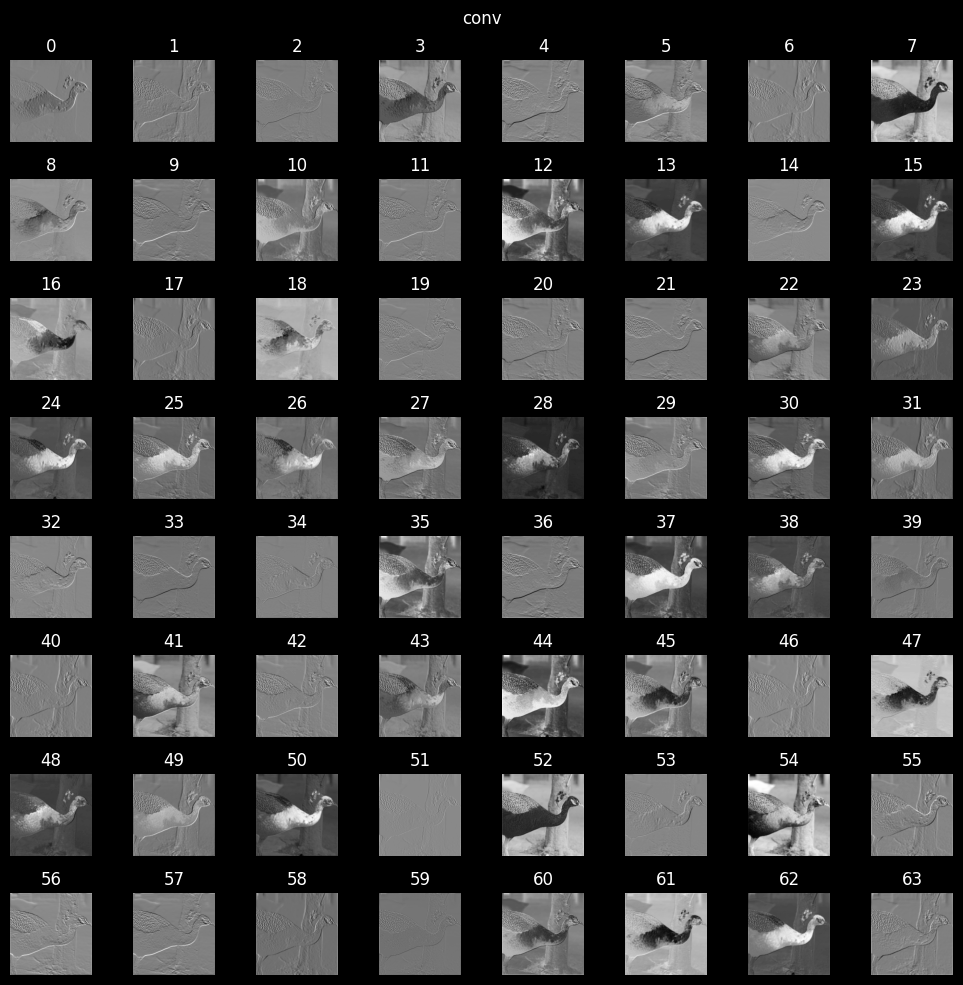
</details>

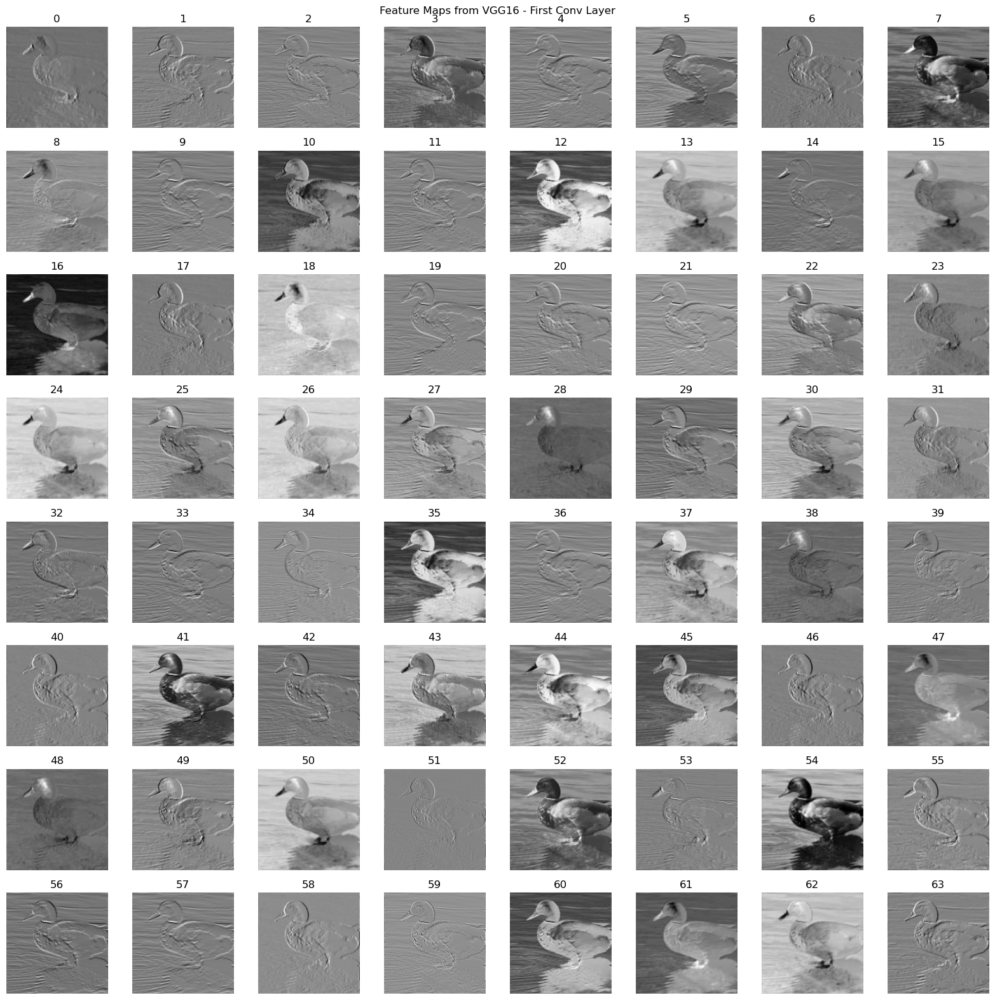

In [50]:
### START CODE HERE ###
#Forward pass through the model to get feature maps
with torch.no_grad():
    # Extract feature maps from the first convolutional layer
    feature_maps = vgg16.features[0](image_tensor)  # Assuming we want to visualize the output of the first conv layer

# Plot the feature maps
plot_featuremap(feature_maps, 'Feature Maps from VGG16 - First Conv Layer')
### END CODE HERE ###

Pass the image to the first ReLU layer and display the feature map output using your `plot_featuremap()` function.
<details>
<summary>
<font size="3" color="orange">
<b>Expected output</b>
</font>
</summary>

- The output should resemble this, but not be identical

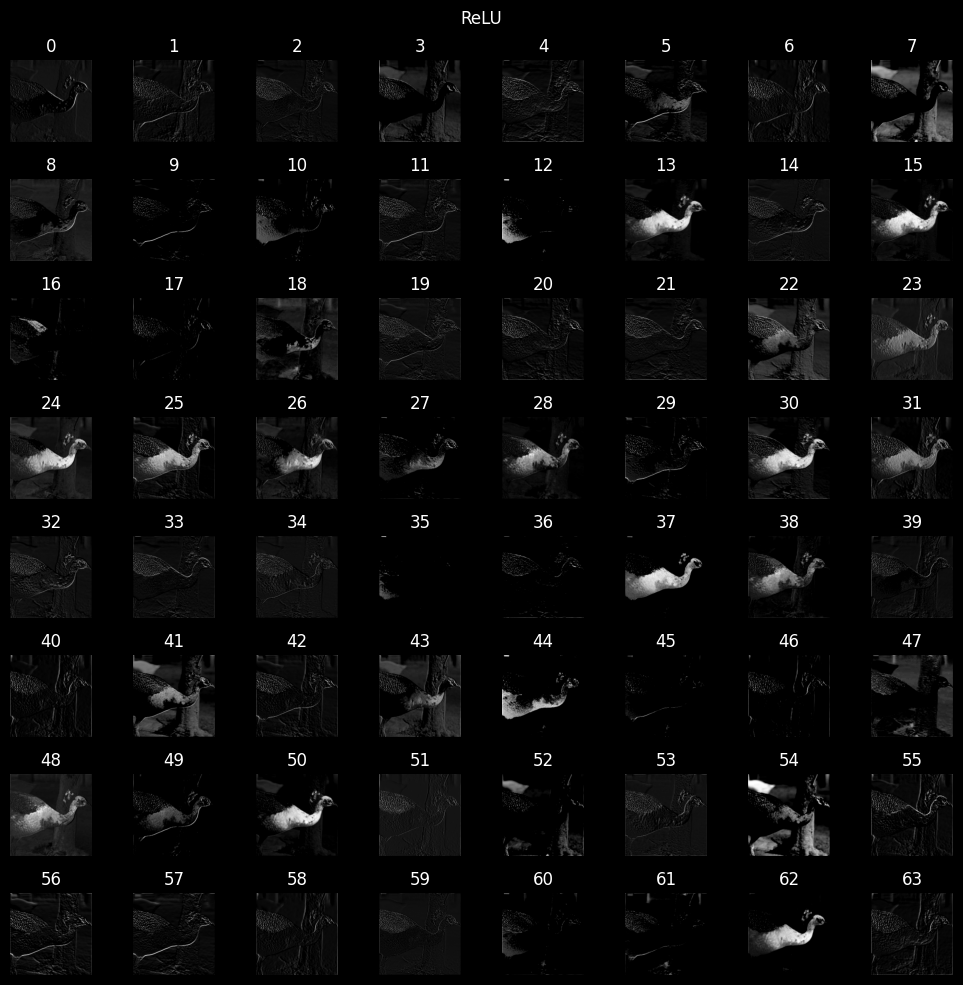

</details>

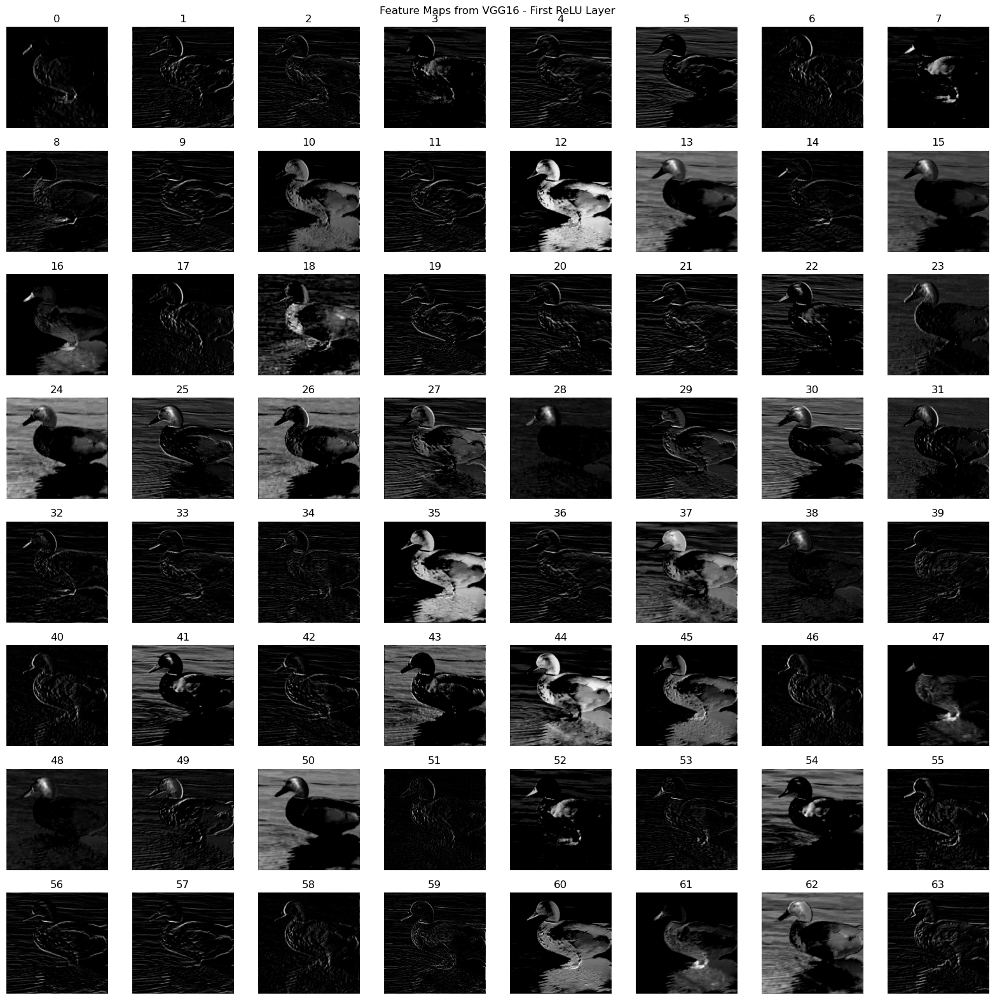

In [51]:
### START CODE HERE ###
with torch.no_grad():
    relu_output = vgg16.features[1](feature_maps)
    
# Plot the feature maps
plot_featuremap(relu_output, 'Feature Maps from VGG16 - First ReLU Layer')
### END CODE HERE ###

## Convolution 2D from scratch
Complete the function below

In [52]:
### START CODE HERE ###
def convolution2d(img, kernel, padding, stride):
    """
    Perform a 2D convolution operation on an image with a given kernel.
    
    Args:
        img (torch.Tensor): Input image tensor of shape [C, H, W].
        kernel (torch.Tensor): Kernel tensor of shape [out_channels, C, kernel_height, kernel_width]. ; weights are in kernel
        padding (int): Padding to apply to the input image.
        stride (int): Stride of the convolution operation.
    
    Returns:
        torch.Tensor: Output feature map tensor.
    """
    # Get dimensions
    # _, C, H, W = img.shape
    C, H, W = img.shape
    out_channels, C_k, kernel_height, kernel_width = kernel.shape
    
    # Compute output dimensions
    out_height = (H + 2 * padding - kernel_height) // stride + 1
    out_width = (W + 2 * padding - kernel_width) // stride + 1
    
    # Add padding to the image manually
    img_padded = torch.zeros((C, H + 2 * padding, W + 2 * padding))
    img_padded[:, padding:padding + H, padding:padding + W] = img
    
    # Initialize output tensor
    output = torch.zeros((out_channels, out_height, out_width))

    print(out_channels, out_height, out_width)
    
    # Perform convolution
    for oc in range(out_channels):
        for i in range(out_height):
            for j in range(out_width):
                # Define the start and end of the convolution window
                start_i = i * stride
                start_j = j * stride
                end_i = start_i + kernel_height
                end_j = start_j + kernel_width
                
                # Extract the patch from the padded image
                img_patch = img_padded[:, start_i:end_i, start_j:end_j]
                
                # Compute the convolution operation for each output pixel
                output[oc, i, j] = torch.sum(img_patch * kernel[oc])
        if(int(oc)%10==0):
            print(oc)
    
    return output
### END CODE HERE ###

Copy the weights and biases from `vgg16` and then use each kernel perform a 2D convolution using `convolution2d` and display the resulting feature map
<details>
<summary>
<font size="3" color="orange">
<b>Expected output</b>
</font>
</summary>

- The output should resemble this, but not be identical

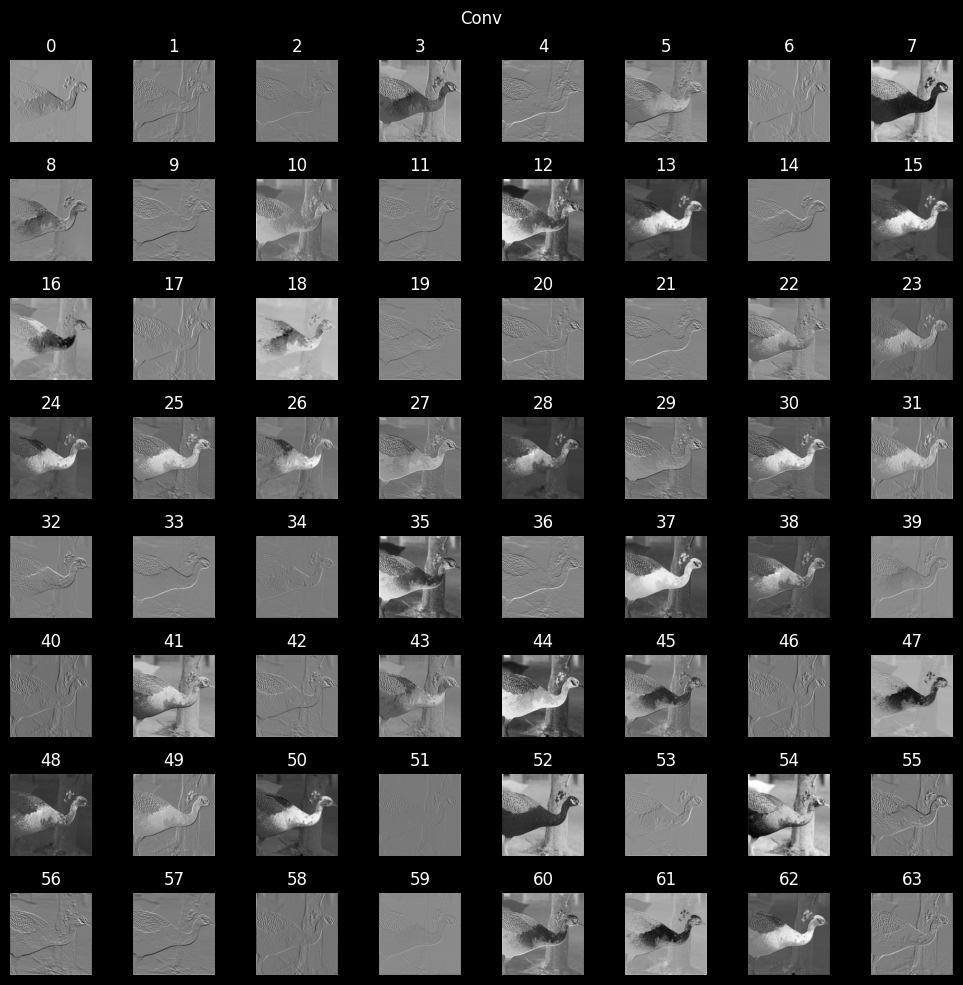

</details>

torch.Size([3, 224, 224])
64 224 224
0
10
20
30
40
50
60


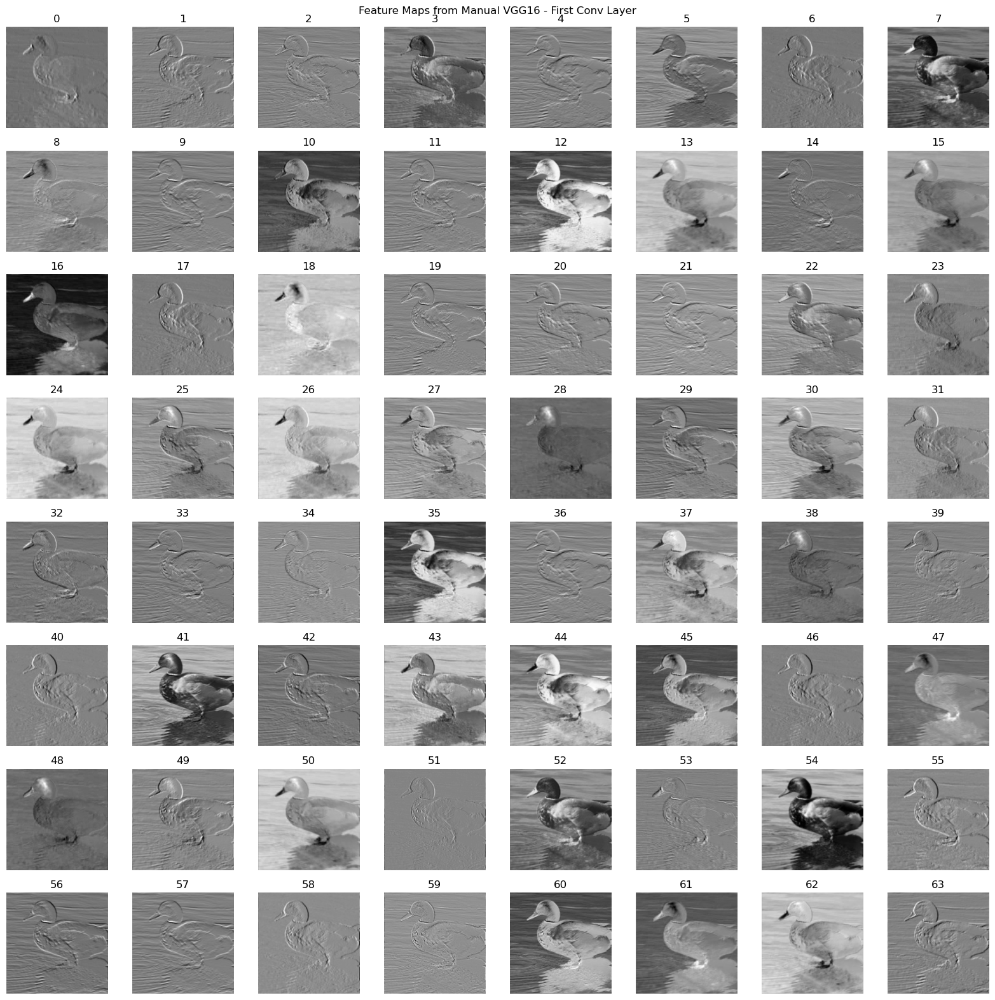

In [53]:
### START CODE HERE ###
# image_tensor = image_tensor.unsqueeze(0).squeeze(0)  # Remove the batch dimension for our custom convolution function

weights = first_conv.weight.data  # Shape: [out_channels, in_channels, kernel_height, kernel_width]
biases = first_conv.bias.data

print(image_tensor.shape)

# Perform convolution using the implemented function
padding = first_conv.padding[0]  # Typically, padding is set to 1 for VGG16
stride = first_conv.stride[0]   # Typically, stride is set to 1 for VGG16

# padding = 0  # Reduced padding
# stride = 2    # Increased stride

feature_maps = convolution2d(image_tensor, weights, padding, stride)

plot_featuremap(feature_maps, 'Feature Maps from Manual VGG16 - First Conv Layer')


### END CODE HERE ###

After performing the `convolution2d` operation, apply the ReLU activation function to the output. Then, display the resulting feature map.
<details>
<summary>
<font size="3" color="orange">
<b>Expected output</b>
</font>
</summary>

- The output should resemble this, but not be identical

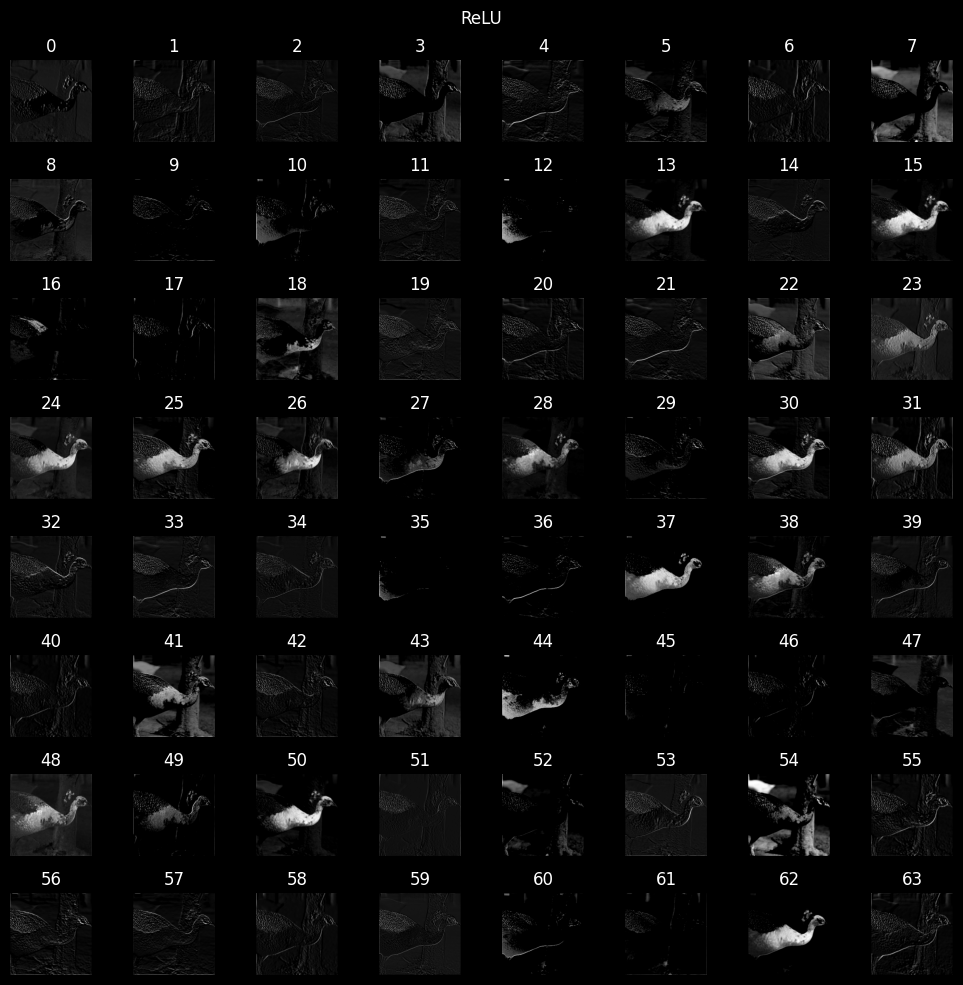

</details>

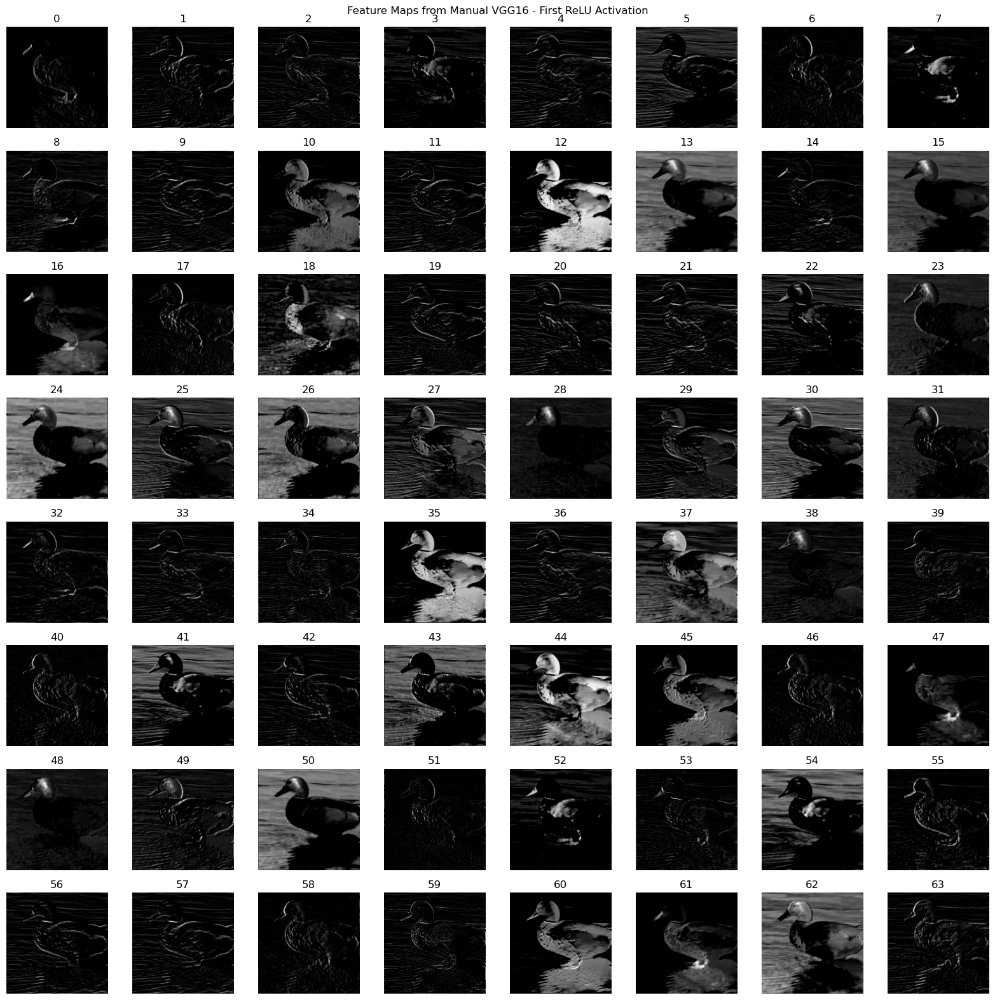

In [54]:
### START CODE HERE ###
def relu(x):
    return torch.maximum(x, torch.tensor(0.0))
relu_feature_maps = relu(feature_maps)
plot_featuremap(relu_feature_maps, 'Feature Maps from Manual VGG16 - First ReLU Activation')
### END CODE HERE ###

---

# Question
1. Show the array of kernel weights used for extracting object color 
and those used for extracting object edge details at least two CNN nodes.
Compare and Discuss how the specific values of these kernel weights influence the CNN's ability 
to detect colors versus edges in images.
2. Why is Matplotlib able to display the output feature map from the convolution layer, even though it contains negative values?
3. Is there a method faster than traditional 2D convolution in the "Convolution 2D from scratch" section?

# Answer
1.1 แสดง weight ของ Edge-detection kernels และ Color-detection kernels โดยมีวิธีการดังนี้

In [55]:
# 1. Load the Pretrained VGG16 Model
# Load the pretrained VGG16 model
vgg16 = models.vgg16(weights='DEFAULT')
vgg16.eval()  # Set the model to evaluation mode

# 2. Extract Convolutional Layers
# Extract convolutional layers from the model
conv_layers = list(vgg16.features.children())
# Extract specific layers
layer1 = conv_layers[0]  # conv1_1 for edge detection
layer2 = conv_layers[5]  # conv2_1 for color detection

# 3. Access Kernel Weights
weights1 = layer1.weight.data.numpy()
weights2 = layer2.weight.data.numpy()

# 4. Display Kernel Weights
def print_kernel_weights(weights, num_kernels=5):
    #num_kernels = min(weights.shape[0], num_kernels)
    num_kernels = 1 # display only kernel 1
    
    for i in range(num_kernels):
        print(f"Kernel {i + 1}:")
        kernel = weights[i, :, :, :]  # Select the kernel
        print(kernel)  # Print the kernel weights
        print()  # New line for better readability

# Display kernel weights for early layer (conv1_1)
print("Kernel weights from edge detection layer (conv1_1):")
print_kernel_weights(weights1)

# Display kernel weights for later layer (conv2_1)
print("Kernel weights from for color detection layer (conv2_1):")
print_kernel_weights(weights2)

Kernel weights from edge detection layer (conv1_1):
Kernel 1:
[[[-0.5537306   0.1427047   0.5289615 ]
  [-0.58312404  0.35655147  0.76566225]
  [-0.69022113 -0.04801885  0.48409155]]

 [[ 0.17548391  0.00986297 -0.08141315]
  [ 0.04408892 -0.07032251 -0.26035076]
  [ 0.13239175 -0.1727862  -0.1322633 ]]

 [[ 0.31302562 -0.1659134  -0.42752257]
  [ 0.47518674 -0.08267727 -0.48699915]
  [ 0.63202524  0.01930757 -0.2775303 ]]]

Kernel weights from for color detection layer (conv2_1):
Kernel 1:
[[[-6.28104508e-02  1.13392407e-02 -4.03911844e-02]
  [-5.16371317e-02 -5.70861660e-02 -1.26468077e-01]
  [-1.38241760e-02 -5.40789068e-02 -8.27411860e-02]]

 [[-5.13607338e-02 -3.35888602e-02 -3.01277172e-02]
  [-3.19813490e-02 -3.51398885e-02  2.42516119e-03]
  [-4.19601006e-03 -1.40638510e-02  1.36422459e-02]]

 [[-2.88379267e-02  5.21357767e-02  5.18484749e-02]
  [-3.73922288e-02  1.43564984e-01 -3.52545194e-02]
  [-2.92684026e-02  2.14878190e-02 -3.17392088e-02]]

 [[ 8.27289466e-03  5.76683378

1.2 <b>การเปรียบเทียบ Edge-detection kernels และ  Color-detection kernels</b></br>

<b>Edge-detection kernels</b>
- จะมีน้ำหนักที่แตกต่างกันและออกแบบมาเพื่อจับความเปลี่ยนแปลงในความเข้มของสี ซึ่งเป็นสัญญาณของขอบ เคอร์เนลเหล่านี้มีค่าที่แตกต่างกัน (เช่น -1, 0, 1) ซึ่งออกแบบมาเพื่อเพิ่มความแตกต่างในพื้นที่ที่มีการเปลี่ยนแปลงระหว่างพื้นที่ที่สว่างและมืด ซึ่งช่วยในการเปิดเผยขอบและขอบเขตภายในภาพ เช่น Sobel

<b>Color-detection kernels</b>
- เคอร์เนลจะมีความไวต่อลักษณะการเปลี่ยนแปลงในความเข้มของสีต่ำกว่า และเน้นไปที่การจับคู่สีโดยรวม โดยไม่เน้นการเปลี่ยนแปลงเฉพาะ แต่เน้นการตรวจจับสีที่สม่ำเสมอ
- ค่าที่เจาะจงในเคอร์เนลมักจะมีน้ำหนักที่เท่ากัน แสดงว่า ฟิลเตอร์นี้ออกแบบมาเพื่อมองหาสีที่สม่ำเสมอหรือเฉลี่ย มากกว่าที่จะตรวจจับลวดลายที่ซับซ้อน

---

2. Matplotlib สามารถแสดงแผนที่ฟีเจอร์ที่มีค่าลบได้เพราะ :</br>
    - ใช้ colormaps เพื่อแปลงค่าข้อมูลเป็นสี
    - ปรับสเกลค่าข้อมูลเพื่อให้พอดีกับช่วงของสี เช่น Normalization
    - ให้ฟังก์ชันการแสดงผลที่จัดการกับค่าข้อมูลที่หลากหลาย ในบริบทของ CNNs (Convolutional Neural Networks) แสดงถึงความแข็งแกร่งของฟีเจอร์ที่ตรวจจับโดยฟิลเตอร์การทำงานร่วมกัน  การแสดงผลแผนที่ฟีเจอร์ช่วยในการเข้าใจว่าระบบเรียนรู้สิ่งใด

---

3. <b>1. Fast Fourier Transform (FFT)</b>
    - การใช้ Fast Fourier Transform (FFT) เป็นวิธีที่นิยมและมีประสิทธิภาพในการเร่งความเร็วการคอนโวลูชัน คอนโวลูชันในโดเมนเชิงพื้นที่สามารถแปลงไปเป็นการคูณในโดเมนความถี่ได้ ด้วยการแปลงทั้งภาพและเคอร์เนลไปยังโดเมนความถี่ การคูณแบบ element-wise แล้วแปลงกลับไปยังโดเมนเชิงพื้นที่สามารถทำให้การคอนโวลูชันเร็วขึ้น โดยเฉพาะสำหรับเคอร์เนลหรือภาพที่มีขนาดใหญ่

    <b>2. Winograd's Minimal Filtering Algorithm</b>
    - อัลกอริธึมการกรองขั้นต่ำของ Winograd ออกแบบมาเพื่อลดจำนวนการคูณที่ต้องใช้ในการคอนโวลูชัน โดยเฉพาะอย่างยิ่งสำหรับเคอร์เนลขนาดเล็กถึงกลาง อัลกอริธึมนี้สามารถลดต้นทุนการคำนวณได้อย่างมีนัยสำคัญเมื่อเปรียบเทียบกับวิธีการคอนโวลูชันแบบมาตรฐาน
    - ข้อดี: ลดจำนวนการคูณและมีประสิทธิภาพสำหรับขนาดเคอร์เนลเฉพาะ

    <b>3. Im2Col (Image-to-Column Transformation)</b>
    - การแปลง Im2Col ใช้แปลงการคอนโวลูชันเป็นการคูณเมทริกซ์ วิธีนี้เกี่ยวข้องกับการแปลงแผ่นภาพที่เคอร์เนลจะคอนโวลูตกับมันให้เป็นเมทริกซ์ 2 มิติ แล้วทำการคูณเมทริกซ์
    - ข้อดี: ใช้ประโยชน์จากรูทีนการคูณเมทริกซ์ที่มีการเพิ่มประสิทธิภาพซึ่งมีอยู่ในไลบรารี BLAS (Basic Linear Algebra Subprograms)
    
    <b>4. Efficient Algorithms for Specific Architectures</b>
    - สถาปัตยกรรมฮาร์ดแวร์สมัยใหม่มักจะมีอัลกอริธึมและการเพิ่มประสิทธิภาพเฉพาะ :
        - CuDNN และ cuBLAS: สำหรับ GPU ของ NVIDIA ไลบรารีเช่น cuDNN (CUDA Deep Neural Network library) และ cuBLAS ให้การติดตั้งการคอนโวลูชันที่มีการเพิ่มประสิทธิภาพสูงซึ่งใช้การเร่ง GPU
        - Intel MKL: สำหรับ CPU ของ Intel ไลบรารี Math Kernel Library (MKL) ให้การติดตั้งการคอนโวลูชันที่มีการเพิ่มประสิทธิภาพ

    <b>5. Sparse Convolutions</b>
    - ในกรณีที่เคอร์เนลหรือภาพที่คอนโวลูทมีความกระจาย (เช่น ส่วนใหญ่ของพวกมันเป็นศูนย์) การใช้ข้อมูลที่กระจายและโครงสร้างข้อมูลที่เฉพาะเจาะจงสามารถช่วยลดการคำนวณ
    - ข้อดี: สามารถให้ความเร็วในการคำนวณที่มากขึ้นสำหรับข้อมูลที่กระจาย

    <b>6. ปรับปรุง Algorith</b>
    การปรับปรุงอัลกอริธึมอื่น ๆ เช่น:
        - Strided Convolutions: ลดจำนวนการคำนวณโดยการข้ามค่าบางอย่างในข้อมูลนำเข้า
        - Dilated Convolutions: เพิ่มขนาดของพื้นที่ที่เคอร์เนลสามารถรับรู้โดยไม่ต้องเพิ่มจำนวนพารามิเตอร์


    <b>>โดยที่เหตุผลที่ Convolution 2D แบบดั้งเดิมอาจช้า:</b>
    - Nested loops: วิธีดั้งเดิมมักใช้วนซ้อน (nested loops) เพื่อวนซ้ำผ่านทุกพิกเซลของภาพและทุกพิกเซลของ filter ทำให้เกิดการคำนวณซ้ำซ้อนจำนวนมาก
    - Memory access pattern: การเข้าถึงหน่วยความจำแบบสุ่ม (random memory access) อาจทำให้เกิด cache miss และลดประสิทธิภาพลง